<a href="https://colab.research.google.com/github/MinaBeric/Stat_method_for_Machine_Learning/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import plotly.express as px
from collections import Counter
import graphviz
from sklearn.tree import export_graphviz
from graphviz import Digraph
from sklearn.metrics import accuracy_score,precision_score, recall_score, f1_score
import pickle
from IPython.display import Image as IPImage
from IPython.display import display

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
data=pd.read_csv("/content/drive/MyDrive/machinelearning/secondary_data.csv",sep=";")

In [5]:
data.head()

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,p,15.26,x,g,o,f,e,NaN,w,16.95,...,s,y,w,u,w,t,g,NaN,d,w
1,p,16.60,x,g,o,f,e,NaN,w,17.99,...,s,y,w,u,w,t,g,NaN,d,u
2,p,14.07,x,g,o,f,e,NaN,w,17.80,...,s,y,w,u,w,t,g,NaN,d,w
3,p,14.17,f,h,e,f,e,NaN,w,15.77,...,s,y,w,u,w,t,p,NaN,d,w
4,p,14.64,x,h,o,f,e,NaN,w,16.53,...,s,y,w,u,w,t,p,NaN,d,w


Let's first inspect possible NA values

In [6]:
data.isnull().sum()

,0
class,0
cap-diameter,0
cap-shape,0
cap-surface,14120
cap-color,0
does-bruise-or-bleed,0
gill-attachment,9884
gill-spacing,25063
gill-color,0
stem-height,0


In [7]:
data=data.drop(columns=['stem-root','stem-surface','veil-type','veil-color','spore-print-color'])

In [8]:
len(data)

61069

In [9]:
data.isnull().sum()

,0
class,0
cap-diameter,0
cap-shape,0
cap-surface,14120
cap-color,0
does-bruise-or-bleed,0
gill-attachment,9884
gill-spacing,25063
gill-color,0
stem-height,0


In [10]:
mode_values=['cap-surface','gill-attachment','gill-spacing','ring-type']
for column in mode_values:
  mode_value=data[column].mode()[0]
  data[column].fillna(mode_value,inplace=True)


<ipython-input-10-50d5d70acaf9>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[column].fillna(mode_value,inplace=True)


In [11]:
print(data.isnull().sum())

class                   0
cap-diameter            0
cap-shape               0
cap-surface             0
cap-color               0
does-bruise-or-bleed    0
gill-attachment         0
gill-spacing            0
gill-color              0
stem-height             0
stem-width              0
stem-color              0
has-ring                0
ring-type               0
habitat                 0
season                  0
dtype: int64


In [12]:
len(data)

61069

Now let's inspect duplicates

In [13]:
data.duplicated().sum()

146

In [14]:
data=data.drop_duplicates()

In [15]:
len(data)

60923

In [16]:
categorical_columns = [col for col in data.select_dtypes(include='object').columns if col != 'class']

In [17]:
numerical_columns = [col for col in data.select_dtypes(include='float64').columns]


# **EXPLANATORY DATA ANALYSIS**

In [18]:
data.describe().round(2)

,cap-diameter,stem-height,stem-width
count,60923.00,60923.00,60923.00
mean,6.74,6.60,12.18
std,5.27,3.36,10.03
min,0.38,0.00,0.00
25%,3.49,4.65,5.25
50%,5.88,5.96,10.22
75%,8.55,7.75,16.58
max,62.34,33.92,103.91


In [19]:
data.describe(include="object")

,class,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-color,has-ring,ring-type,habitat,season
count,60923,60923,60923,60923,60923,60923,60923,60923,60923,60923,60923,60923,60923
unique,2,7,11,12,2,7,3,12,13,2,8,8,4
top,p,x,t,n,f,a,c,w,w,f,f,d,a
freq,33742,26932,22304,24205,50333,22552,49744,18492,22926,45756,50686,44063,30141


**Let's first examine the target variable**

In [20]:
data['class'].value_counts()

,count
class,
p,33742
e,27181


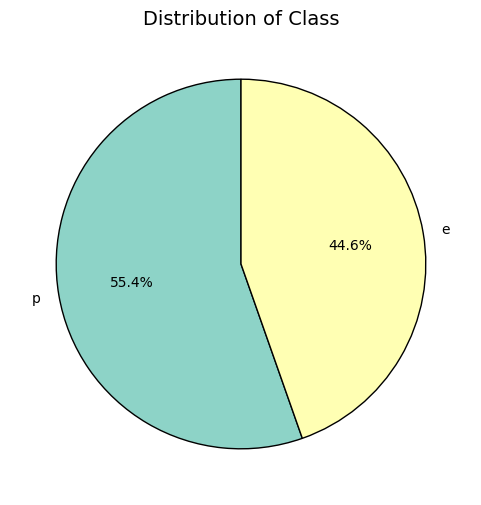

In [21]:
class_proportions=data['class'].value_counts(normalize=True)*100

plt.figure(figsize=(6, 6))
plt.pie(
    class_proportions,
    labels=class_proportions.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Set3.colors,
    wedgeprops={'edgecolor': 'black'}
)


plt.title("Distribution of Class", fontsize=14)

plt.show()

Seems pretty balanced, no balancing methods are therefore applied

**Let's examine the attributes**

In [22]:
#firts categorical attributes
for col in categorical_columns:
    print(data[col].value_counts())
    print("\n")

cap-shape
x    26932
f    13404
s     7164
b     5694
o     3316
p     2598
c     1815
Name: count, dtype: int64


cap-surface
t    22304
s     7580
y     6341
h     4974
g     4722
d     4432
e     2584
k     2303
i     2225
w     2150
l     1308
Name: count, dtype: int64


cap-color
n    24205
y     8541
w     7649
g     4312
e     4035
o     3653
r     1779
u     1709
p     1703
k     1279
b     1230
l      828
Name: count, dtype: int64


does-bruise-or-bleed
f    50333
t    10590
Name: count, dtype: int64


gill-attachment
a    22552
d    10247
x     7413
p     6001
e     5648
s     5648
f     3414
Name: count, dtype: int64


gill-spacing
c    49744
d     7765
f     3414
Name: count, dtype: int64


gill-color
w    18492
n     9645
y     9545
p     5983
g     4118
f     3414
o     2909
k     2375
r     1399
e     1066
u     1023
b      954
Name: count, dtype: int64


stem-color
w    22926
n    18063
y     7864
g     2626
o     2187
e     2049
u     1490
p     1025
f      915
k      

In [23]:
for col in categorical_columns:
    fig = px.histogram(data,
                       x=col,
                       color='class',
                       barmode='group',
                       color_discrete_map={'e': 'lime', 'p': 'red'},
                       text_auto=True)
    fig.update_layout(
        title=f"Distribution of {col} by Class",
        xaxis_title=col,
        yaxis_title="Count",
        legend_title="Class",
        legend=dict(itemsizing="constant"),
    )
    fig.update_traces(marker_line_color='black', marker_line_width=1)
    fig.show()


In [24]:

for col in numerical_columns:
    fig = px.violin(data_frame=data,
                    x='class',
                    y=col,
                    color='class',
                    color_discrete_map={'e': 'lime', 'p': 'red'},
                    box=True,
                    points="all")
    fig.update_layout(title=f"Distribution of {col} by Class",
                      xaxis_title="Class",
                      yaxis_title=col)
    fig.show()

In [25]:
for col in numerical_columns:
    fig = px.box(
        data_frame=data,
        x='class',
        y=col,
        color='class',
        color_discrete_map={'e': 'lime', 'p': 'red'},
        title=f"Distribution of {col} by Class"
    )
    fig.update_layout(
        xaxis_title="Class",
        yaxis_title=col,
        boxmode='group'
    )
    fig.show()

              cap-diameter  stem-height  stem-width
cap-diameter      1.000000     0.421718    0.695047
stem-height       0.421718     1.000000    0.433214
stem-width        0.695047     0.433214    1.000000


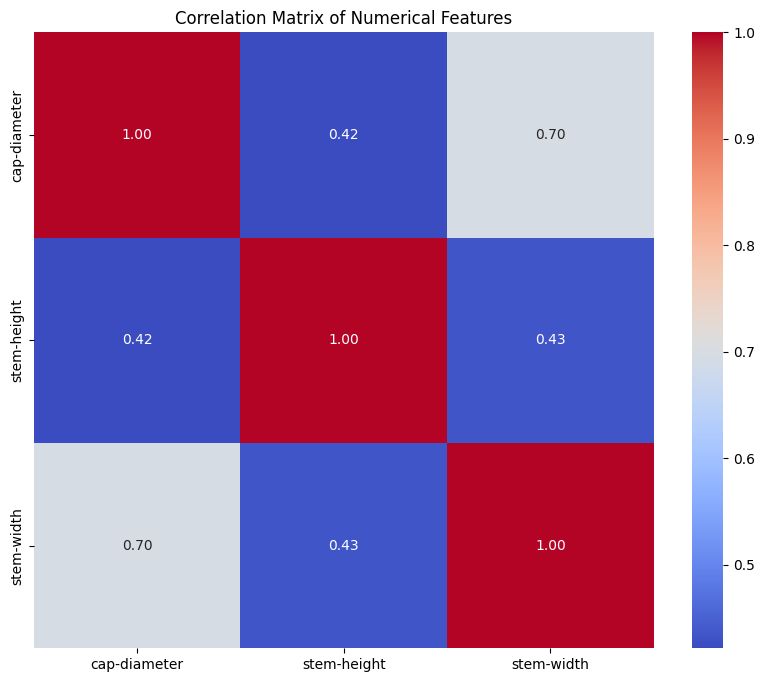

In [26]:
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns


correlation_matrix = data[numerical_columns].corr()


print(correlation_matrix)


plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Numerical Features")
plt.show()

**ONE HOT ENCODING**

In [27]:
data["class"].replace(["p","e"],[1,0],inplace=True)

<ipython-input-27-fae5a61ee501>:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



<ipython-input-27-fae5a61ee501>:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [28]:
data_encoded = pd.get_dummies(data, columns=categorical_columns, drop_first=True)
print(data_encoded.head())

   class  cap-diameter  stem-height  stem-width  cap-shape_c  cap-shape_f  \
0      1         15.26        16.95       17.09        False        False   
1      1         16.60        17.99       18.19        False        False   
2      1         14.07        17.80       17.74        False        False   
3      1         14.17        15.77       15.98        False         True   
4      1         14.64        16.53       17.20        False        False   

   cap-shape_o  cap-shape_p  cap-shape_s  cap-shape_x  ...  habitat_g  \
0        False        False        False         True  ...      False   
1        False        False        False         True  ...      False   
2        False        False        False         True  ...      False   
3        False        False        False        False  ...      False   
4        False        False        False         True  ...      False   

   habitat_h  habitat_l  habitat_m  habitat_p  habitat_u  habitat_w  season_s  \
0      False     

In [29]:
exclude_columns = ["cap-diameter", "stem-height", "stem-width"]

columns_to_convert = [col for col in data_encoded.columns if col not in exclude_columns]

data_encoded[columns_to_convert] = data_encoded[columns_to_convert].astype(int)

In [30]:
data_encoded.head(10)

,class,cap-diameter,stem-height,stem-width,cap-shape_c,cap-shape_f,cap-shape_o,cap-shape_p,cap-shape_s,cap-shape_x,...,habitat_g,habitat_h,habitat_l,habitat_m,habitat_p,habitat_u,habitat_w,season_s,season_u,season_w
0,1,15.26,16.95,17.09,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
1,1,16.60,17.99,18.19,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
2,1,14.07,17.80,17.74,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
3,1,14.17,15.77,15.98,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1,14.64,16.53,17.20,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
5,1,15.34,17.84,18.79,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
6,1,14.85,17.71,16.89,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,1,14.86,17.03,17.44,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
8,1,12.85,17.27,18.69,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,13.55,16.04,16.88,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [31]:
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 60923 entries, 0 to 61068
Data columns (total 81 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   class                   60923 non-null  int64  
 1   cap-diameter            60923 non-null  float64
 2   stem-height             60923 non-null  float64
 3   stem-width              60923 non-null  float64
 4   cap-shape_c             60923 non-null  int64  
 5   cap-shape_f             60923 non-null  int64  
 6   cap-shape_o             60923 non-null  int64  
 7   cap-shape_p             60923 non-null  int64  
 8   cap-shape_s             60923 non-null  int64  
 9   cap-shape_x             60923 non-null  int64  
 10  cap-surface_e           60923 non-null  int64  
 11  cap-surface_g           60923 non-null  int64  
 12  cap-surface_h           60923 non-null  int64  
 13  cap-surface_i           60923 non-null  int64  
 14  cap-surface_k           60923 non-null  int

**TRAIN AND TEST SPLIT**

In [32]:
X = data_encoded.drop('class', axis=1)
y = data_encoded['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y,random_state=42)

In [33]:
X_test = X_test.apply(pd.to_numeric, errors='coerce')

In [34]:

X_train.to_pickle("/content/drive/MyDrive/machinelearning/X_train.pkl")
X_test.to_pickle("/content/drive/MyDrive/machinelearning/X_test.pkl")
y_train.to_pickle("/content/drive/MyDrive/machinelearning/y_train.pkl")
y_test.to_pickle("/content/drive/MyDrive/machinelearning/y_test.pkl")


In [35]:
#tree structure
class Node:
    def __init__(self, feature=None, threshold=None, left=None, right=None, value=None):
        self.feature = feature
        self.threshold = threshold
        self.left = left
        self.right = right
        self.value = value

    def is_leaf(self):
        return self.value is not None

class Decision_Tree:
    def __init__(self, min_samples_split=2, max_depth=20, n_features=None, criterion='entropy', min_impurity_decrease=0.001):
        self.min_samples_split = min_samples_split
        self.max_depth = max_depth
        self.n_features = n_features
        self.criterion = criterion
        self.min_impurity_decrease = min_impurity_decrease
        self.root = None
        self.class_labels = {0: 'e', 1: 'p'}
        self.feature_names = None

    def get_params(self, deep=True):
        return {
            'min_samples_split': self.min_samples_split,
            'max_depth': self.max_depth,
            'n_features': self.n_features,
            'criterion': self.criterion,
            'min_impurity_decrease': self.min_impurity_decrease
        }

    def set_params(self, **params):
        for param, value in params.items():
            if hasattr(self, param):
                setattr(self, param, value)
        return self

    def fit(self, X, y, feature_names=None):
        self.feature_names = feature_names
        self.n_features = X.shape[1] if not self.n_features else min(X.shape[1], self.n_features)
        self.root = self._grow_tree(X, y)


    def _grow_tree(self, X, y, depth=0):
        n_samples, n_feats = X.shape
        n_labels = len(np.unique(y))

        if self.criterion == "entropy":
            parent_impurity = self._scaled_entropy(y)
        elif self.criterion == "gini":
            parent_impurity = self._gini(y)
        elif self.criterion == "squared_impurity":
            parent_impurity = self._squared_impurity(y)

        if (depth >= self.max_depth or n_labels == 1 or
                n_samples < self.min_samples_split or
                parent_impurity < self.min_impurity_decrease):
            leaf_value = self._most_common_label(y)
            return Node(value=leaf_value)

        feat_idxs = np.random.choice(n_feats, self.n_features, replace=False)
        best_feature, best_thresh = self._best_split(X, y, feat_idxs)

        left_idxs, right_idxs = self._split(X[:, best_feature], best_thresh)
        left = self._grow_tree(X[left_idxs, :], y[left_idxs], depth + 1)
        right = self._grow_tree(X[right_idxs, :], y[right_idxs], depth + 1)

        return Node(best_feature, best_thresh, left, right)

    def _best_split(self, X, y, feat_idxs):
        best_gain = -1
        split_idx, split_threshold = None, None

        for feat_idx in feat_idxs:
            X_column = X[:, feat_idx]
            thresholds = np.unique(X_column)

            for thr in thresholds:
                gain = self._information_gain(y, X_column, thr)
                if gain > best_gain:
                    best_gain = gain
                    split_idx = feat_idx
                    split_threshold = thr

        return split_idx, split_threshold

    def _information_gain(self, y, X_column, threshold):
        if self.criterion == 'entropy':
            parent_impurity = self._scaled_entropy(y)
        elif self.criterion == 'gini':
            parent_impurity = self._gini(y)
        elif self.criterion == "squared_impurity":
            parent_impurity = self._squared_impurity(y)

        left_idxs, right_idxs = self._split(X_column, threshold)

        if len(left_idxs) == 0 or len(right_idxs) == 0:
            return 0

        n = len(y)
        n_l, n_r = len(left_idxs), len(right_idxs)
        e_l = self._scaled_entropy(y[left_idxs]) if self.criterion == 'entropy' else self._gini(y[left_idxs]) if self.criterion == 'gini' else self._squared_impurity(y[left_idxs])
        e_r = self._scaled_entropy(y[right_idxs]) if self.criterion == 'entropy' else self._gini(y[right_idxs]) if self.criterion == 'gini' else self._squared_impurity(y[right_idxs])

        child_impurity = (n_l / n) * e_l + (n_r / n) * e_r
        return parent_impurity - child_impurity

    def _split(self, X_column, split_thresh):
        left_idxs = np.argwhere(X_column <= split_thresh).flatten()
        right_idxs = np.argwhere(X_column > split_thresh).flatten()
        return left_idxs, right_idxs

    def _scaled_entropy(self, y):
        p = np.sum(y) / len(y)
        if p == 0 or p == 1:
            return 0
        return -2 * p * np.log2(p) - 2 * (1 - p) * np.log2(1 - p)

    def _gini(self, y):
        p = np.sum(y) / len(y)
        return 2 * p * (1 - p)

    def _squared_impurity(self, y):
        p = np.sum(y) / len(y)
        return np.sqrt(p * (1 - p))

    def _most_common_label(self, y):
        counter = Counter(y)
        value = counter.most_common(1)[0][0]
        return value

    def predict(self, X):
        return np.array([self._traverse_tree(x, self.root) for x in X])

    def _traverse_tree(self, x, node):
        if node.is_leaf():
            return node.value

        if x[node.feature] <= node.threshold:
            return self._traverse_tree(x, node.left)
        return self._traverse_tree(x, node.right)

    def accuracy(self, y_test, y_pred):
        """
        Compute accuracy of predictions.
        """
        return np.sum(y_test == y_pred) / len(y_test)

    def evaluate(self, X_test, y_test,data_type='test'):
        """
        Evaluate the decision tree on the test set.
        """
        predictions = self.predict(X_test)
        acc = self.accuracy(y_test, predictions)
        if data_type == 'train':
            print(f"Training Accuracy with {self.criterion}: {acc}")
        else:
            print(f"Test Accuracy with {self.criterion}: {acc}")


    def compute_zero_one_loss(self, X, y,data_type='training'):
        """
        Computes the training error using zero-one loss.
        """
        predictions = self.predict(X)
        errors = np.sum(predictions != y)
        total_samples = len(y)
        error_rate = errors / total_samples
        print(f"The {data_type} error with {self.criterion} is {error_rate}")


    def to_dict(self, node=None):
        """Convert the tree into a dictionary format for visualization."""
        if node is None:
            node = self.root

        if node.is_leaf():
            return self.class_labels[node.value]

        feature_name=( self.feature_names[node.feature] if self.feature_names else f"Feature {node.feature}")


        return {
            f"{feature_name} <= {node.threshold}": {
                "Left": self.to_dict(node.left),
                "Right": self.to_dict(node.right),
            }
        }

    def visualize(self, filename="tree"):
        def add_nodes_edges(node, graph, node_id=0):
            if node.is_leaf():
                label = self.class_labels.get(node.value, f"Class {node.value}")
                graph.node(str(node_id), f"Leaf: {label}", shape="box", style="filled", color="lightsalmon")
                return node_id

            feature_name = self.feature_names[node.feature] if self.feature_names else f"Feature {node.feature}"
            graph.node(str(node_id), f"{feature_name} <= {node.threshold}", shape="ellipse", style="filled", color="powderblue")

            left_id = node_id + 1
            graph.edge(str(node_id), str(left_id), label=f"<= {node.threshold}", color="lightgreen")
            left_id = add_nodes_edges(node.left, graph, left_id)

            right_id = left_id + 1
            graph.edge(str(node_id), str(right_id), label=f"> {node.threshold}", color="red")
            right_id = add_nodes_edges(node.right, graph, right_id)

            return right_id

        graph = Digraph()
        add_nodes_edges(self.root, graph)
        graph.render(filename, format="png", cleanup=True)
        print(f"Tree visualization saved as {filename}.png")


**Baseline Tree predictor training using the 3 splitting criteria. Evaluation of train error according to 0-1 loss.**

In [36]:
splitting_criteria = ['entropy', 'gini', 'squared_impurity']


for criterion in splitting_criteria:
    print(f"\nTraining Decision Tree with criterion: {criterion}")
    tree = Decision_Tree(criterion=criterion)
    tree.fit(X_train.values, y_train.values,feature_names=X_train.columns.tolist())

    # Compute training error
    tree.compute_zero_one_loss(X_train.values, y_train.values, data_type='training')

    tree.visualize(filename=f"tree_{criterion}")



Training Decision Tree with criterion: entropy
The training error with entropy is 0.0020723049776355204
Tree visualization saved as tree_entropy.png

Training Decision Tree with criterion: gini
The training error with gini is 0.003959949115679757
Tree visualization saved as tree_gini.png

Training Decision Tree with criterion: squared_impurity
The training error with squared_impurity is 0.004554967376585005
Tree visualization saved as tree_squared_impurity.png


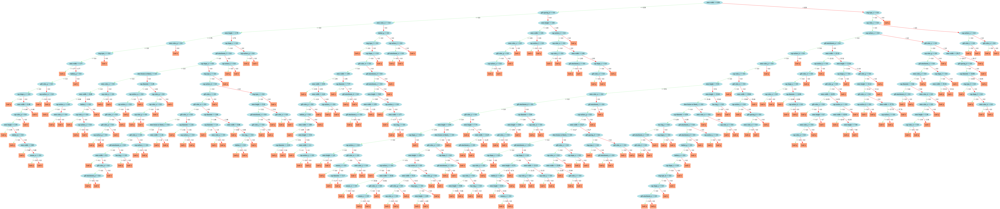

In [37]:
display(IPImage(filename="tree_entropy.png"))

# **Final tree with best parameters found during hyperparameter tuning**

In [38]:
load_path = "/content/drive/MyDrive/machinelearning/best_params.pkl"

In [39]:
def load_best_params(filename=load_path):

    try:
        with open(filename, 'rb') as f:
            return pickle.load(f)
    except FileNotFoundError:
        return None

best_params = load_best_params()
print(f"Loaded best parameters: {best_params}")


Loaded best parameters: {'max_depth': 20, 'min_impurity_decrease': 0.01, 'criterion': 'entropy', 'min_samples_split': 3}


In [40]:
final_model = Decision_Tree(**best_params)
final_model.fit(X_train.values, y_train.values,feature_names=X_train.columns.tolist())

In [41]:
# Evaluate on the test set
y_test_pred = final_model.predict(X_test.values)

In [42]:
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)

In [43]:
y_train_pred = final_model.predict(X_train.values)

# training metrics
train_accuracy = accuracy_score(y_train, y_train_pred)
train_precision = precision_score(y_train, y_train_pred)
train_recall = recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)


In [44]:
metrics_comparison = pd.DataFrame({
    "Dataset": ["Training", "Test"],
    "Accuracy": [train_accuracy, test_accuracy],
    "Precision": [train_precision, test_precision],
    "Recall": [train_recall, test_recall],
    "F1 Score": [train_f1, test_f1],
})

print(metrics_comparison)

    Dataset  Accuracy  Precision    Recall  F1 Score
0  Training  0.997907   0.997410  0.998815  0.998112
1      Test  0.995322   0.994678  0.996888  0.995782


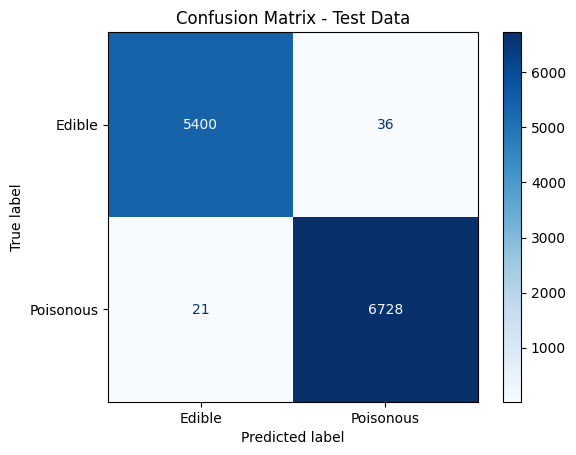

In [45]:
#confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Edible", "Poisonous"])

disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix - Test Data")
plt.show()


In [46]:
print(cm)

[[5400   36]
 [  21 6728]]


In [47]:
final_model.compute_zero_one_loss(X_train.values, y_train.values, data_type='training')
final_model.compute_zero_one_loss(X_test.values, y_test.values, data_type='test')

The training error with entropy is 0.002092822848701219
The test error with entropy is 0.004677882642593352


In [48]:
final_model.to_dict()


{'stem-width <= 8.38': {'Left': {'gill-spacing_d <= 0.0': {'Left': {'stem-color_w <= 0.0': {'Left': {'stem-height <= 3.78': {'Left': {'stem-color_g <= 0.0': {'Left': {'ring-type_r <= 0.0': {'Left': {'stem-width <= 4.77': {'Left': 'p',
              'Right': {'habitat_g <= 0.0': {'Left': {'gill-color_p <= 0.0': {'Left': {'cap-shape_x <= 0.0': {'Left': 'p',
                    'Right': {'stem-width <= 6.48': {'Left': {'cap-color_p <= 0.0': {'Left': {'stem-height <= 3.55': {'Left': 'p',
                          'Right': {'habitat_m <= 0.0': {'Left': 'p',
                            'Right': {'stem-width <= 5.89': {'Left': 'e',
                              'Right': {'gill-color_e <= 0.0': {'Left': 'p',
                                'Right': 'e'}}}}}}}},
                        'Right': 'e'}},
                      'Right': 'e'}}}},
                  'Right': {'cap-diameter <= 3.75': {'Left': 'e',
                    'Right': 'p'}}}},
                'Right': 'e'}}}},
            'Right

In [49]:
final_model.visualize()

Tree visualization saved as tree.png


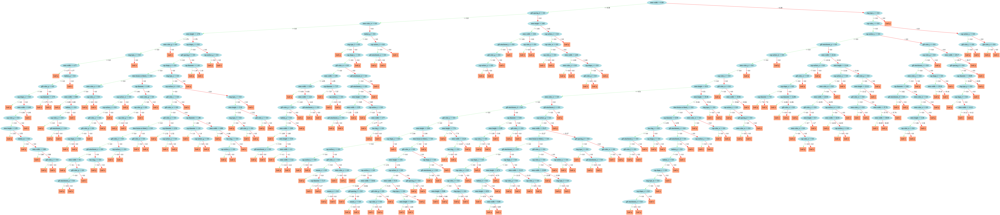

In [50]:
from IPython.display import Image as IPImage
from IPython.display import display

# Display the PNG file
display(IPImage(filename="tree.png"))
